# Activity 3 - Noise Superposition

Filter the B1 files from the dataset using glob with regex.

In [1]:
import glob
steps = sorted(glob.glob('./dataset/G1_Hd1_FTDS_SP1_050418_162003_1_0_*[0-9]_B1.csv'), key=len) # Get steps with wildcard 0-9 for B1 using regex.
print(steps) # Preview the list of gathered files.
print("Number of files: {}".format(len(steps))) # Count the number of files.

['./dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_0_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_1_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_2_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_3_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_4_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_5_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_6_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_7_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_8_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_9_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_10_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_11_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_12_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_13_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_14_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_15_B1.csv', './dataset\\G1_Hd1_FTDS_SP1_050418_162003_1_0_16_B1.csv', './dataset\\G1_Hd1_FTDS

Import all necessary the libraries for analysis.

In [2]:
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

Create a new data frame to save the calculated information for the original step values with base noise.

In [3]:
original_analysis_df = pd.DataFrame(columns=['Step Number', 'Mean', 'Standard Deviation', 'Standard Error']) # Create a new data frame to store the analysis summary.
original_analysis_df # Preview the empty dataframe.

,Step Number,Mean,Standard Deviation,Standard Error


Create a new data frame to save the calculated information for the new step values without base noise.

In [4]:
modified_analysis_df = pd.DataFrame(columns=['Step Number', 'Mean', 'Standard Deviation', 'Standard Error']) # Create a new data frame to store the analysis summary.
modified_analysis_df # Preview the empty dataframe.

,Step Number,Mean,Standard Deviation,Standard Error


Get the B1 base noise values.

In [5]:
B1_NOISE_FILE_PATH = './dataset/G1_Hd1_FTDS_SP1_050418_162003_1_0_BaseNoise_B1.csv'
noise_df = pd.read_csv(B1_NOISE_FILE_PATH, skiprows=5)
noise_df = noise_df[['AE [V]']]
noise_df

,AE [V]
0,0.000000
1,0.026855
2,0.034180
3,0.012207
4,-0.031738
...,...
41661,-0.039062
41662,-0.014648
41663,-0.014648
41664,-0.019531


Create a `for` loop to do analysis for each step.

In [6]:
for step in steps:
    step_num = steps.index(step) # Get the current step from index.
    
    # == Original (with Base Noise)===
    original_df = pd.read_csv(step, skiprows=5) # Skip the first five rows in the csv file.
    original_df = original_df[['AE [V]']] # Restructure the dataframe to get only the 'AE [V]' column.
    
    entries_count = original_df.count()['AE [V]'] # Get number of entries from the 'AE [V]' column.
    mean = original_df.mean()['AE [V]'] # Get mean of entries from the 'AE [V]' column.
    std_dev = original_df.std()['AE [V]'] # Get standard deviation of entries from the 'AE [V]' column.
    std_err = original_df.sem()['AE [V]'] # Get standard error of entries from the 'AE [V]' column.
    
    original_new_entry = {'Step Number':step_num, 'Mean':mean, 'Standard Deviation':std_dev, 'Standard Error':std_err} # Create a dictionary for the entry to be added to the analysis dataframe.
    original_analysis_df = original_analysis_df.append(original_new_entry, ignore_index=True) # Add the entry to the analysis dataframe.
    
    # Display the calculated information for each step.
    print("Step {} (with Base Noise)".format(step_num)) # Display the current step.
    print("Number of entries: {}".format(entries_count)) # Display the number of entries.
    print("Mean: {}".format(mean)) # Display the mean.
    print("Standard Deviation: {}".format(std_dev)) # Display the standard deviation.
    print("Standard Error: {}".format(std_err)) # Display the standard error.
    print("\n".format(step_num)) # Separator for each display iteration.
    
    
    # == Modified (without Base Noise)===
    modified_df = original_df[['AE [V]']].subtract(noise_df[['AE [V]']], fill_value=0) # Subtract the noise from the 'AE [V]' column of the B1 noise file to the 'AE [V]' column of each step then save into a temporary data frame.
    
    entries_count = modified_df.count()['AE [V]'] # Get number of entries from the 'AE [V]' column.
    mean = modified_df.mean()['AE [V]'] # Get mean of entries from the 'AE [V]' column.
    std_dev = modified_df.std()['AE [V]'] # Get standard deviation of entries from the 'AE [V]' column.
    std_err = modified_df.sem()['AE [V]'] # Get standard error of entries from the 'AE [V]' column.
    
    modified_new_entry = {'Step Number':step_num, 'Mean':mean, 'Standard Deviation':std_dev, 'Standard Error':std_err} # Create a dictionary for the entry to be added to the analysis dataframe.
    modified_analysis_df = modified_analysis_df.append(modified_new_entry, ignore_index=True) # Add the entry to the analysis dataframe.
    
    # Display the calculated information for each step.
    print("Step {} (without Base Noise)".format(step_num)) # Display the current step.
    print("Number of entries: {}".format(entries_count)) # Display the number of entries.
    print("Mean: {}".format(mean)) # Display the mean.
    print("Standard Deviation: {}".format(std_dev)) # Display the standard deviation.
    print("Standard Error: {}".format(std_err)) # Display the standard error.
    print("\n".format(step_num)) # Separator for each display iteration.
    
    print("=======\n".format(step_num)) # Separator for each display iteration.

Step 0 (with Base Noise)
Number of entries: 41666
Mean: -0.00021322413958623334
Standard Deviation: 0.06477799847313867
Standard Error: 0.0003173486244351058


Step 0 (without Base Noise)
Number of entries: 41666
Mean: 0.0001885017280276485
Standard Deviation: 0.06972860192058224
Standard Error: 0.00034160172319087207



Step 1 (with Base Noise)
Number of entries: 41666
Mean: -0.0006970991695867134
Standard Deviation: 0.06384584151696783
Standard Error: 0.00031278197009611605


Step 1 (without Base Noise)
Number of entries: 41666
Mean: -0.0002953733019728316
Standard Deviation: 0.0696453733660963
Standard Error: 0.00034119398494791316



Step 2 (with Base Noise)
Number of entries: 41666
Mean: -0.00024914544232707724
Standard Deviation: 0.06467102872262355
Standard Error: 0.00031682457762936486


Step 2 (without Base Noise)
Number of entries: 41666
Mean: 0.00015258042528680456
Standard Deviation: 0.06926336229309309
Standard Error: 0.0003393225055661163



Step 3 (with Base Noise)
Numbe

Step 27 (without Base Noise)
Number of entries: 41666
Mean: -0.0003138903662458601
Standard Deviation: 0.07010739966401686
Standard Error: 0.00034345746041109426



Step 28 (with Base Noise)
Number of entries: 41666
Mean: -0.00038121605145682337
Standard Deviation: 0.06277667675420666
Standard Error: 0.0003075441119536259


Step 28 (without Base Noise)
Number of entries: 41666
Mean: 2.0509816157058498e-05
Standard Deviation: 0.06899879828847964
Standard Error: 0.00033802640156602225



Step 29 (with Base Noise)
Number of entries: 41666
Mean: -0.0008321043776700427
Standard Deviation: 0.0644438543346237
Standard Error: 0.00031571164605941933


Step 29 (without Base Noise)
Number of entries: 41666
Mean: -0.0004303785100561609
Standard Deviation: 0.07048164470283516
Standard Error: 0.0003452908938463663



Step 30 (with Base Noise)
Number of entries: 41666
Mean: -0.0003319963999423991
Standard Deviation: 0.06477999273442686
Standard Error: 0.0003173583943584052


Step 30 (without Base Noi

Step 54 (without Base Noise)
Number of entries: 41666
Mean: 0.00019816869869917925
Standard Deviation: 0.0706955224128648
Standard Error: 0.00034633868474258204



Step 55 (with Base Noise)
Number of entries: 41666
Mean: -0.0001531063937022993
Standard Deviation: 0.06469576932168364
Standard Error: 0.000316945782286262


Step 55 (without Base Noise)
Number of entries: 41666
Mean: 0.00024861947391158245
Standard Deviation: 0.07058422765738653
Standard Error: 0.0003457934496567448



Step 56 (with Base Noise)
Number of entries: 41666
Mean: -0.0006761848989583833
Standard Deviation: 0.06541305444318751
Standard Error: 0.0003204597754938696


Step 56 (without Base Noise)
Number of entries: 41666
Mean: -0.00027445903134450144
Standard Deviation: 0.07044442964655581
Standard Error: 0.00034510857659055563



Step 57 (with Base Noise)
Number of entries: 41666
Mean: -0.0005966096817549081
Standard Deviation: 0.0641344435673394
Standard Error: 0.00031419583693135866


Step 57 (without Base Noise

Step 82 (with Base Noise)
Number of entries: 41666
Mean: -0.0005528402054432872
Standard Deviation: 0.0654842385291786
Standard Error: 0.0003208085076607072


Step 82 (without Base Noise)
Number of entries: 41666
Mean: -0.00015111433782940534
Standard Deviation: 0.07021429217704656
Standard Error: 0.0003439811288289515



Step 83 (with Base Noise)
Number of entries: 41666
Mean: -0.0005323335093361493
Standard Deviation: 0.06460683220476202
Standard Error: 0.00031651007768930685


Step 83 (without Base Noise)
Number of entries: 41666
Mean: -0.00013060764172226764
Standard Deviation: 0.07148566834974082
Standard Error: 0.0003502096244455828



Step 84 (with Base Noise)
Number of entries: 41666
Mean: -0.0005933303652858445
Standard Deviation: 0.06503949115122268
Standard Error: 0.00031862968194916626


Step 84 (without Base Noise)
Number of entries: 41666
Mean: -0.00019160449767196275
Standard Deviation: 0.06945606839415779
Standard Error: 0.00034026657635457223



Step 85 (with Base Nois

Step 113 (without Base Noise)
Number of entries: 41666
Mean: 0.0003043999183986944
Standard Deviation: 0.27942923518004315
Standard Error: 0.0013689290422906725



Step 114 (with Base Noise)
Number of entries: 41666
Mean: -0.0001969933758940143
Standard Deviation: 0.24678203430449885
Standard Error: 0.001208989795421124


Step 114 (without Base Noise)
Number of entries: 41666
Mean: 0.00020473249171986768
Standard Deviation: 0.24740912207354107
Standard Error: 0.0012120619101143274



Step 115 (with Base Noise)
Number of entries: 41666
Mean: -0.00019687908606537725
Standard Deviation: 0.19070492648835038
Standard Error: 0.00093426699682874


Step 115 (without Base Noise)
Number of entries: 41666
Mean: 0.0002048467815485048
Standard Deviation: 0.19134394710607225
Standard Error: 0.000937397570770505



Step 116 (with Base Noise)
Number of entries: 41666
Mean: -0.00016429930878894075
Standard Deviation: 0.22804616206462708
Standard Error: 0.0011172024073717584


Step 116 (without Base Noi

Step 141 (without Base Noise)
Number of entries: 41666
Mean: 0.00014226777228435654
Standard Deviation: 0.13789967868317018
Standard Error: 0.0006755731015414737



Step 142 (with Base Noise)
Number of entries: 41666
Mean: -0.00031306991311861
Standard Deviation: 0.13653982232422157
Standard Error: 0.0006689111398397608


Step 142 (without Base Noise)
Number of entries: 41666
Mean: 8.865595449527185e-05
Standard Deviation: 0.13750577243188733
Standard Error: 0.0006736433474591083



Step 143 (with Base Noise)
Number of entries: 41666
Mean: -0.00031301320021120347
Standard Deviation: 0.13398618717131033
Standard Error: 0.0006564008335291767


Step 143 (without Base Noise)
Number of entries: 41666
Mean: 8.871266740267864e-05
Standard Deviation: 0.13523878371446435
Standard Error: 0.0006625373273899267



Step 144 (with Base Noise)
Number of entries: 41666
Mean: -0.00037512127394038303
Standard Deviation: 0.13548914550914043
Standard Error: 0.0006637638544982706


Step 144 (without Base N

Step 167 (without Base Noise)
Number of entries: 41666
Mean: -0.00018123505976095624
Standard Deviation: 0.1448308170814368
Standard Error: 0.0007095288780135015



Step 168 (with Base Noise)
Number of entries: 41666
Mean: -0.000596085681370902
Standard Deviation: 0.12093298663993968
Standard Error: 0.0005924529603199759


Step 168 (without Base Noise)
Number of entries: 41666
Mean: -0.00019435981375702014
Standard Deviation: 0.1213836971223245
Standard Error: 0.0005946609993914921



Step 169 (with Base Noise)
Number of entries: 41666
Mean: -0.0002786183698939183
Standard Deviation: 0.10337518992517183
Standard Error: 0.000506436986272039


Step 169 (without Base Noise)
Number of entries: 41666
Mean: 0.0001231074977199635
Standard Deviation: 0.10408085057822408
Standard Error: 0.0005098940309915817



Step 170 (with Base Noise)
Number of entries: 41666
Mean: -0.00030621434742955867
Standard Deviation: 0.10247385892532948
Standard Error: 0.0005020213488688657


Step 170 (without Base N

Step 194 (without Base Noise)
Number of entries: 41666
Mean: -0.00017373306772908368
Standard Deviation: 0.0714657519700412
Standard Error: 0.00035011205372943873



Step 195 (with Base Noise)
Number of entries: 41666
Mean: -0.0005364960159362549
Standard Deviation: 0.06643703264433524
Standard Error: 0.00032547626382702663


Step 195 (without Base Noise)
Number of entries: 41666
Mean: -0.00013477014832237306
Standard Deviation: 0.07039340847229779
Standard Error: 0.0003448586229048986





Ensure that there is an exports directory.

In [7]:
EXPORTS_PATH = './exports' # The 'exports/' path in the current directory.

EXPORTS_SUMMARY_PATH = './{}/summary'.format(EXPORTS_PATH) # The 'exports/summary/' path in the current directory.
if not os.path.exists(EXPORTS_SUMMARY_PATH):
        os.makedirs(EXPORTS_SUMMARY_PATH) # Create the 'exports/images/' directory if it does not exists.
        
EXPORTS_IMAGES_PATH = './{}/images'.format(EXPORTS_PATH) # The 'exports/images/' path in the current directory.
if not os.path.exists(EXPORTS_IMAGES_PATH):
        os.makedirs(EXPORTS_IMAGES_PATH) # Create the 'exports/images/' directory if it does not exists.

Preview new entries for the `original_analysis_df` dataframe.

In [8]:
original_analysis_df['Step Number'] = original_analysis_df['Step Number'].astype(int) # Convert Step Number into int.
original_analysis_df # Preview the contents of the dataframe.

,Step Number,Mean,Standard Deviation,Standard Error
0,0,-0.000213,0.064778,0.000317
1,1,-0.000697,0.063846,0.000313
2,2,-0.000249,0.064671,0.000317
3,3,-0.000214,0.064206,0.000315
4,4,-0.000307,0.063390,0.000311
...,...,...,...,...
191,191,-0.000309,0.080963,0.000397
192,192,-0.000387,0.068082,0.000334
193,193,-0.000317,0.066013,0.000323
194,194,-0.000575,0.066285,0.000325


In [9]:
original_analysis_df.info() # Show a quick summary about the dataframe.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Step Number         196 non-null    int32  
 1   Mean                196 non-null    float64
 2   Standard Deviation  196 non-null    float64
 3   Standard Error      196 non-null    float64
dtypes: float64(3), int32(1)
memory usage: 5.5 KB


Export the `original_analysis_df` dataframe to a file named `original_summary.csv`.

In [10]:
FILE_NAME='original_summary.csv' # The filename for the .csv file.
original_analysis_df.to_csv('./{}/{}'.format(EXPORTS_SUMMARY_PATH, FILE_NAME), index=False) # Exporting the file to current directory.

Preview new entries for the `modified_analysis_df` dataframe.

In [11]:
modified_analysis_df['Step Number'] = modified_analysis_df['Step Number'].astype(int) # Convert Step Number into int.
modified_analysis_df # Preview the contents of the dataframe.

,Step Number,Mean,Standard Deviation,Standard Error
0,0,0.000189,0.069729,0.000342
1,1,-0.000295,0.069645,0.000341
2,2,0.000153,0.069263,0.000339
3,3,0.000188,0.069674,0.000341
4,4,0.000095,0.069234,0.000339
...,...,...,...,...
191,191,0.000092,0.083903,0.000411
192,192,0.000014,0.072162,0.000354
193,193,0.000085,0.070448,0.000345
194,194,-0.000174,0.071466,0.000350


In [12]:
modified_analysis_df.info() # Show a quick summary about the dataframe.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Step Number         196 non-null    int32  
 1   Mean                196 non-null    float64
 2   Standard Deviation  196 non-null    float64
 3   Standard Error      196 non-null    float64
dtypes: float64(3), int32(1)
memory usage: 5.5 KB


Export the `modified_analysis_df` dataframe to a file named `modified_summary.csv`.

In [13]:
FILE_NAME='modified_summary.csv' # The filename for the .csv file.
modified_analysis_df.to_csv('./{}/{}'.format(EXPORTS_SUMMARY_PATH, FILE_NAME), index=False) # Exporting the file to current directory.

Create a `for` loop to plot each step.

<ipython-input-14-1297c8d1a734>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(2,2) # Figure subplot mapping to render time-series plot and histogram side-by-side


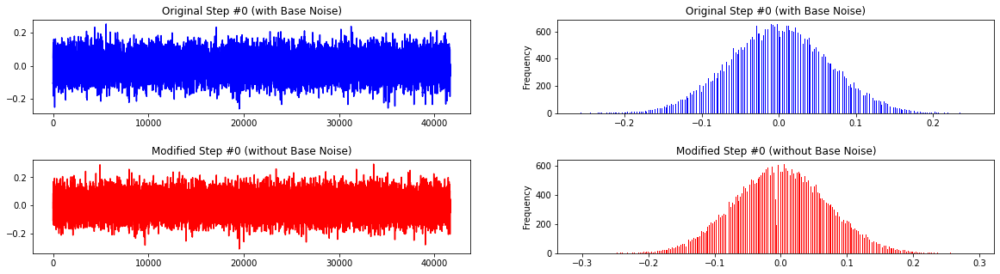

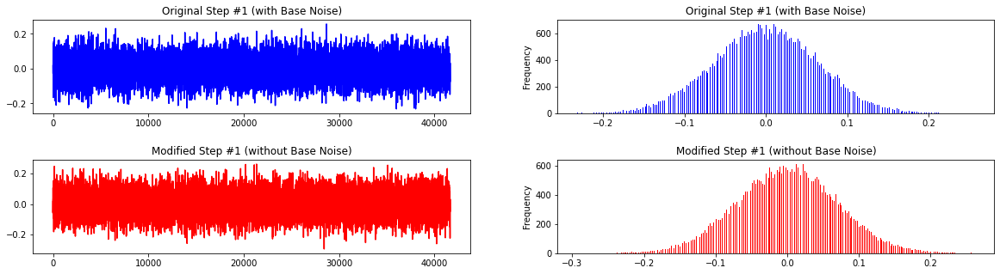

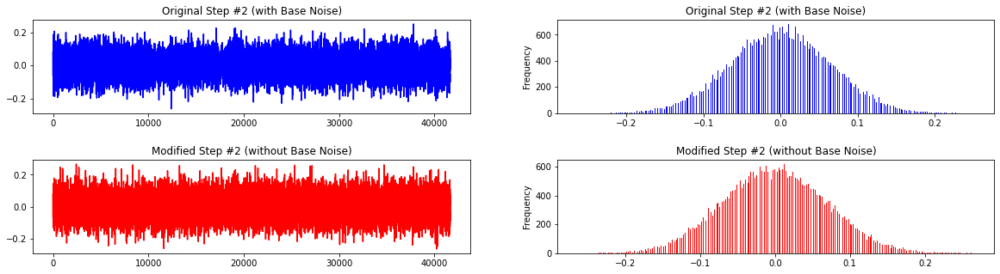

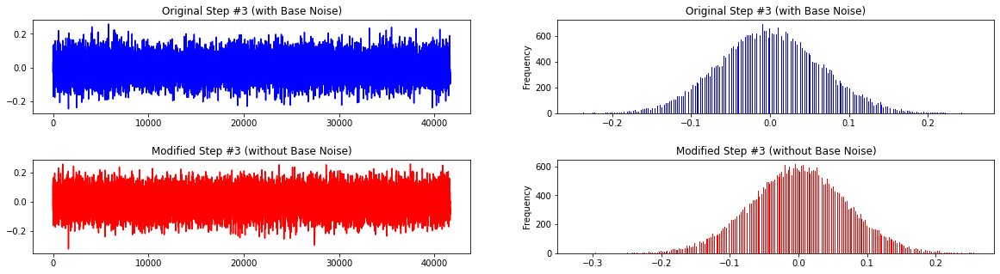

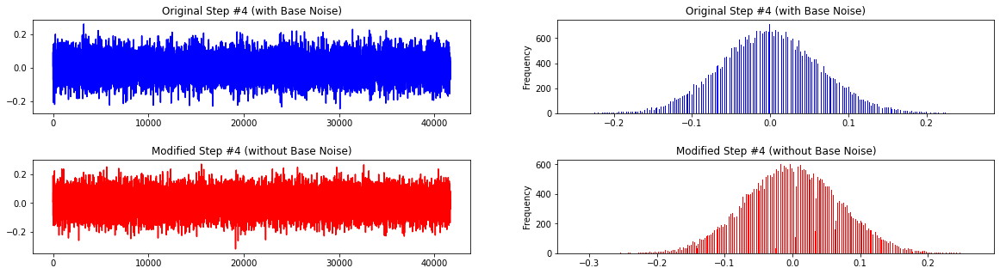

...

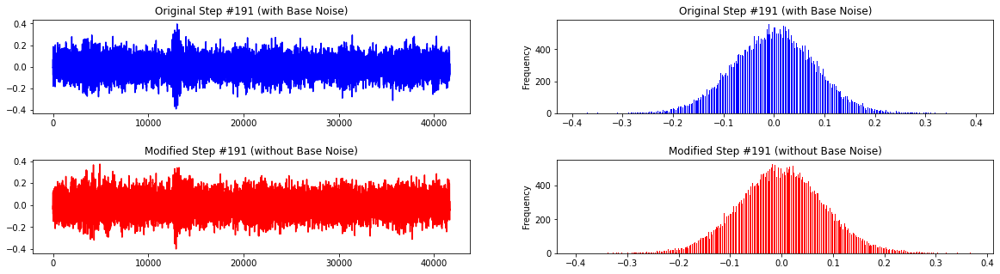

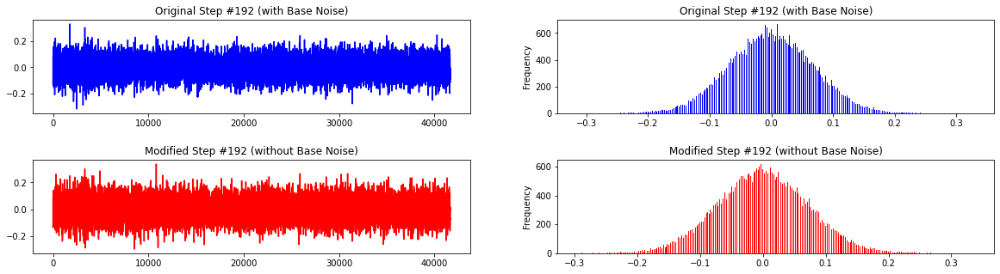

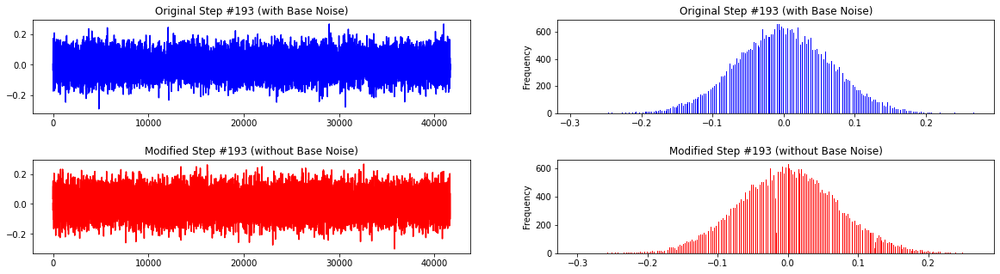

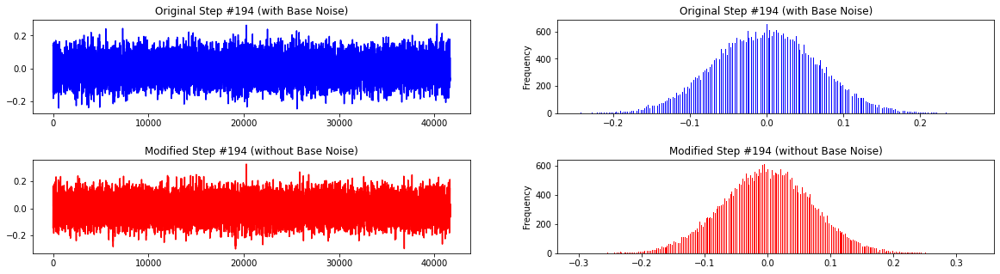

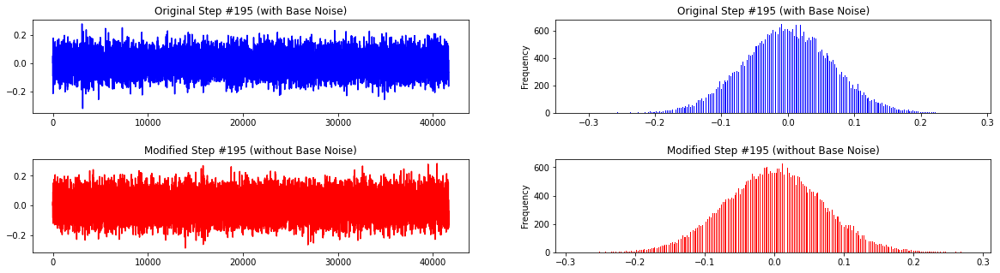

In [14]:
# Iterate through each step in the list of steps.
for step in steps:
    step_num = steps.index(step) # Get the current step from index.
    
    # == Original (with Base Noise)===
    original_df = pd.read_csv(step, skiprows=5) # Skip the first five rows in the csv file.
    original_df = original_df[['AE [V]']] # Restructure the dataframe to get only the 'AE [V]' column.

    # == Modified (without Base Noise)===
    modified_df = original_df[['AE [V]']].subtract(noise_df[['AE [V]']], fill_value=0) # Subtract the noise from the 'AE [V]' column of the B1 noise file to the 'AE [V]' column of each step then save into a temporary data frame.

    fig, axs = plt.subplots(2,2) # Figure subplot mapping to render time-series plot and histogram side-by-side
    fig.subplots_adjust(hspace=0.5)

    original_df['AE [V]'].plot(ax=axs[0,0], color='blue', title="Original Step #{} (with Base Noise)".format(step_num), figsize=(20,15)) # The time-series plot.
    original_df['AE [V]'].plot(kind='hist', color='blue', bins=500, ax=axs[0,1], title="Original Step #{} (with Base Noise)".format(step_num), figsize=(20,5)) # The histogram.
    modified_df['AE [V]'].plot(ax=axs[1,0], color='red', title="Modified Step #{} (without Base Noise)".format(step_num), figsize=(20,15)) # The time-series plot.
    modified_df['AE [V]'].plot(kind='hist', color='red', bins=500, ax=axs[1,1], title="Modified Step #{} (without Base Noise)".format(step_num), figsize=(20,5)) # The histogram.
    
    IMG_FILENAME = 'Step-#{}.png'.format(step_num) # File name of the imgae to be exported.
    IMG_PATH = './images' # Path to the images directory.
    if not os.path.exists(IMG_PATH):
        os.makedirs(IMG_PATH) # Create the 'images' directory if it does not exists.
    fig.savefig('{}/{}'.format(IMG_PATH, IMG_FILENAME)) # Save and export the plot to an image.

Load the saved `original_summary.csv` earlier into a dataframe.

In [15]:
ORIGINAL_SUMMARY_PATH='./exports/summary/original_summary.csv' # Declare the path of the .csv file.
original_summary_df = pd.read_csv(ORIGINAL_SUMMARY_PATH) # Load the .csv file.
original_summary_df # Preview the entries for the dataframe.

,Step Number,Mean,Standard Deviation,Standard Error
0,0,-0.000213,0.064778,0.000317
1,1,-0.000697,0.063846,0.000313
2,2,-0.000249,0.064671,0.000317
3,3,-0.000214,0.064206,0.000315
4,4,-0.000307,0.063390,0.000311
...,...,...,...,...
191,191,-0.000309,0.080963,0.000397
192,192,-0.000387,0.068082,0.000334
193,193,-0.000317,0.066013,0.000323
194,194,-0.000575,0.066285,0.000325


Load the saved `modified_summary.csv` earlier into a dataframe.

In [16]:
MODIFIED_SUMMARY_PATH='./exports/summary/modified_summary.csv' # Declare the path of the .csv file.
modified_summary_df = pd.read_csv(MODIFIED_SUMMARY_PATH) # Load the .csv file.
modified_summary_df # Preview the entries for the dataframe.

,Step Number,Mean,Standard Deviation,Standard Error
0,0,0.000189,0.069729,0.000342
1,1,-0.000295,0.069645,0.000341
2,2,0.000153,0.069263,0.000339
3,3,0.000188,0.069674,0.000341
4,4,0.000095,0.069234,0.000339
...,...,...,...,...
191,191,0.000092,0.083903,0.000411
192,192,0.000014,0.072162,0.000354
193,193,0.000085,0.070448,0.000345
194,194,-0.000174,0.071466,0.000350


Plotting of means per step for the original (with base noise) and modified (without base noise).

<AxesSubplot:title={'center':'Modified Steps (without Base Noise) Plotting of Means Per Step'}>

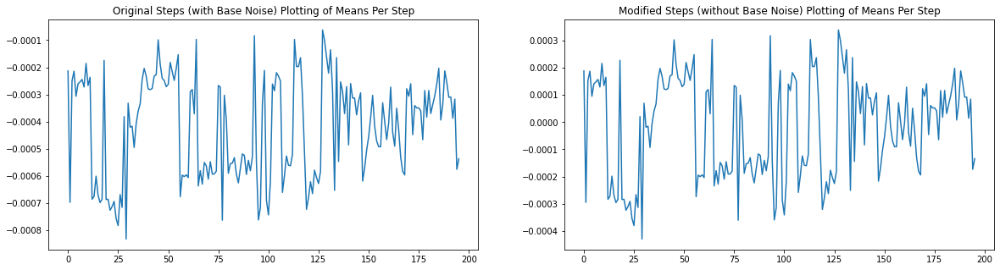

In [17]:
fig, axs = plt.subplots(1,2) # Figure subplot mapping to render time-series plot and histogram side-by-side
    
original_summary_df['Mean'].plot(ax=axs[0], title="Original Steps (with Base Noise) Plotting of Means Per Step", figsize=(20,5)) # Plot the time-series graph of means per step.
modified_summary_df['Mean'].plot(ax=axs[1], title="Modified Steps (without Base Noise) Plotting of Means Per Step", figsize=(20,5)) # Plot the time-series graph of means per step.

Save the plot in to an image file

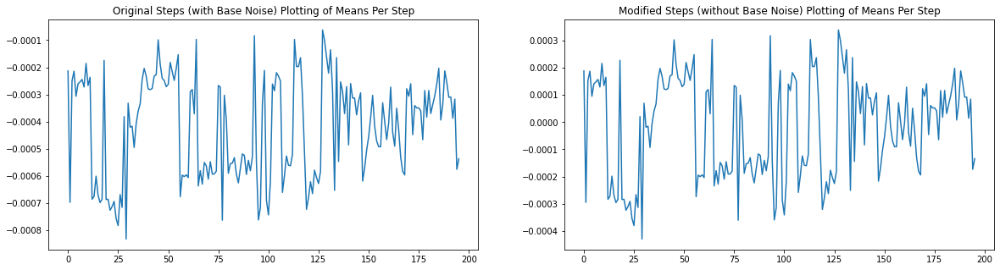

In [18]:
SUMMARY_IMG = 'TS-Means-Per-Step.png' # File name of the imgae to be exported.

fig, axs = plt.subplots(1,2) # Figure subplot mapping to render time-series plot and histogram side-by-side
    
original_summary_df['Mean'].plot(ax=axs[0], title="Original Steps (with Base Noise) Plotting of Means Per Step", figsize=(20,5)) # Plot the time-series graph of means per step.
modified_summary_df['Mean'].plot(ax=axs[1], title="Modified Steps (without Base Noise) Plotting of Means Per Step", figsize=(20,5)) # Plot the time-series graph of means per step.
fig.savefig('{}/{}'.format(EXPORTS_IMAGES_PATH, SUMMARY_IMG)) # Save and export the plot to an image.